## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### 1. Camera Calibration

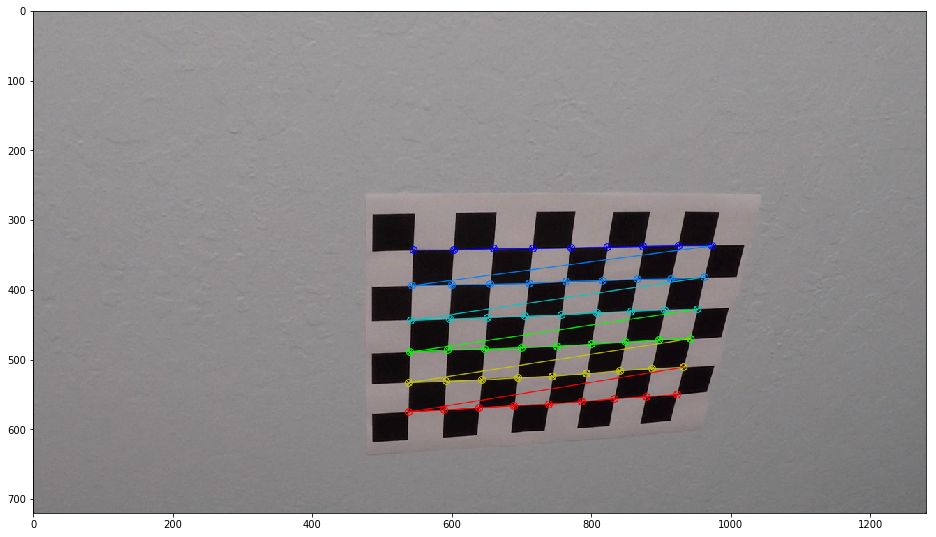

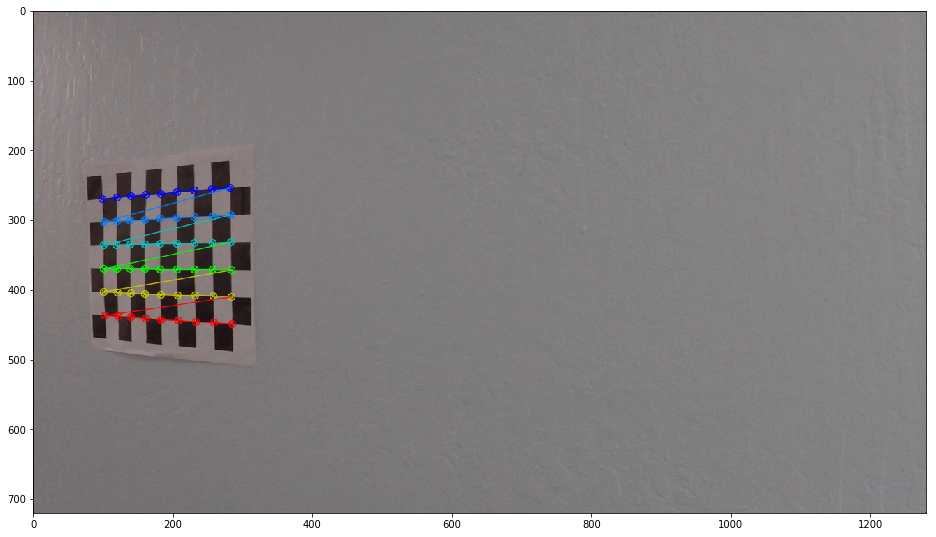

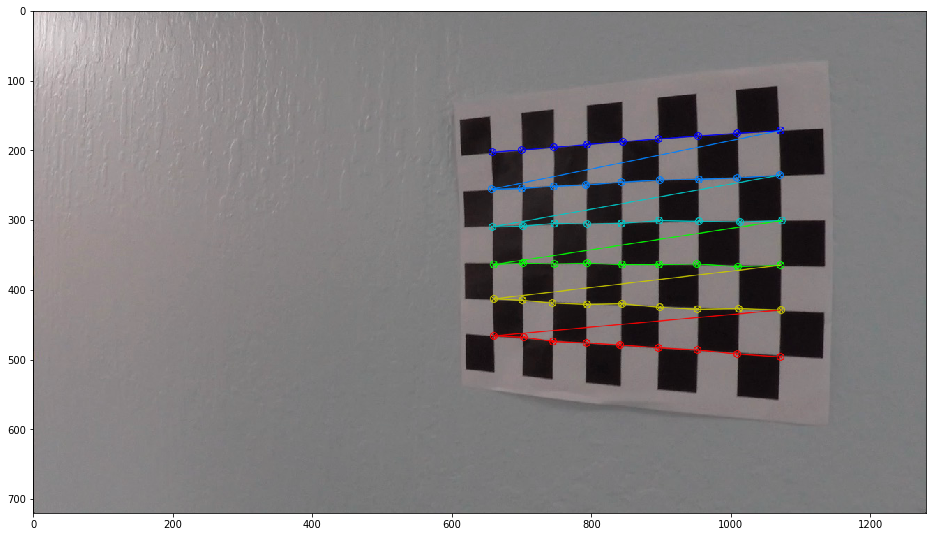

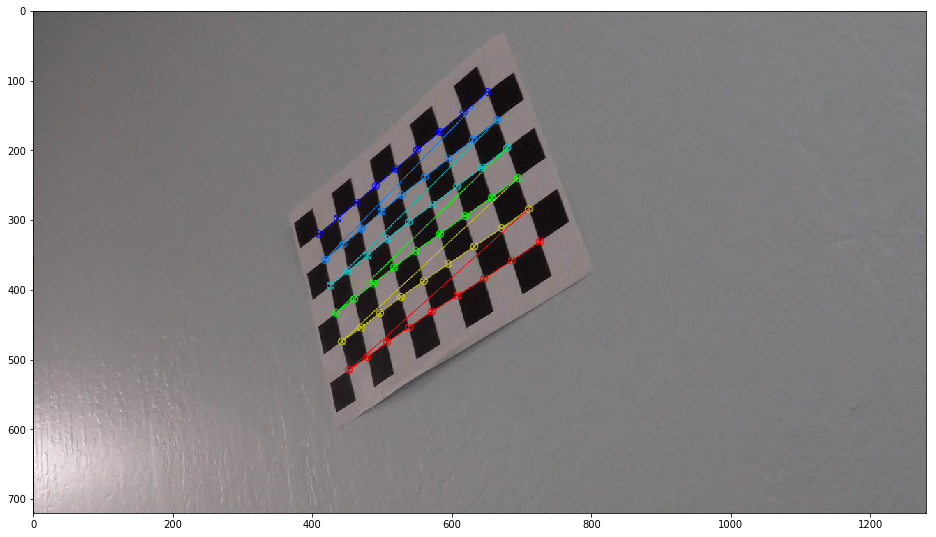

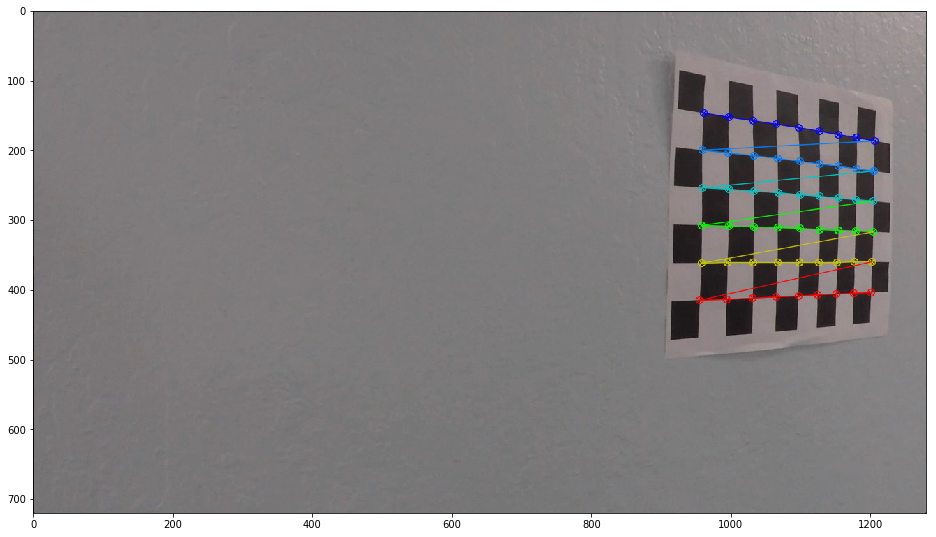

...

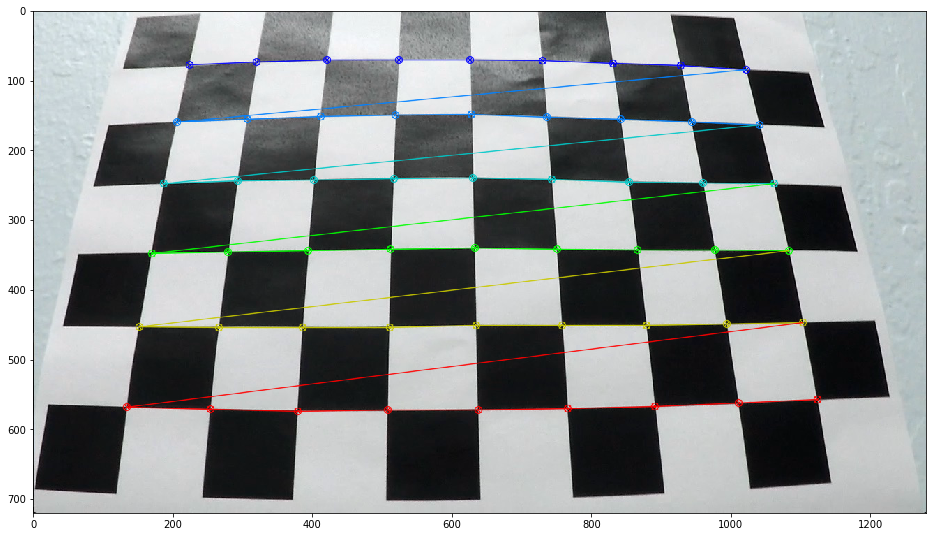

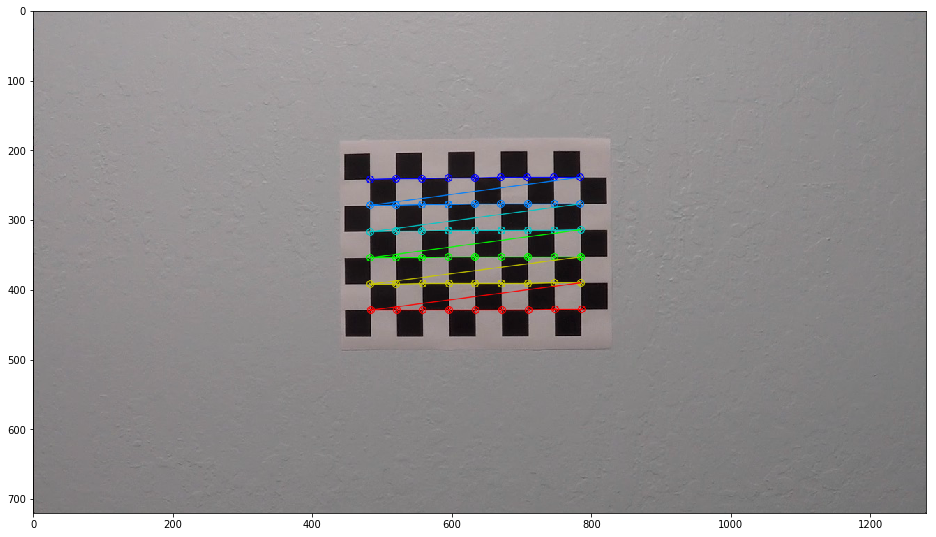

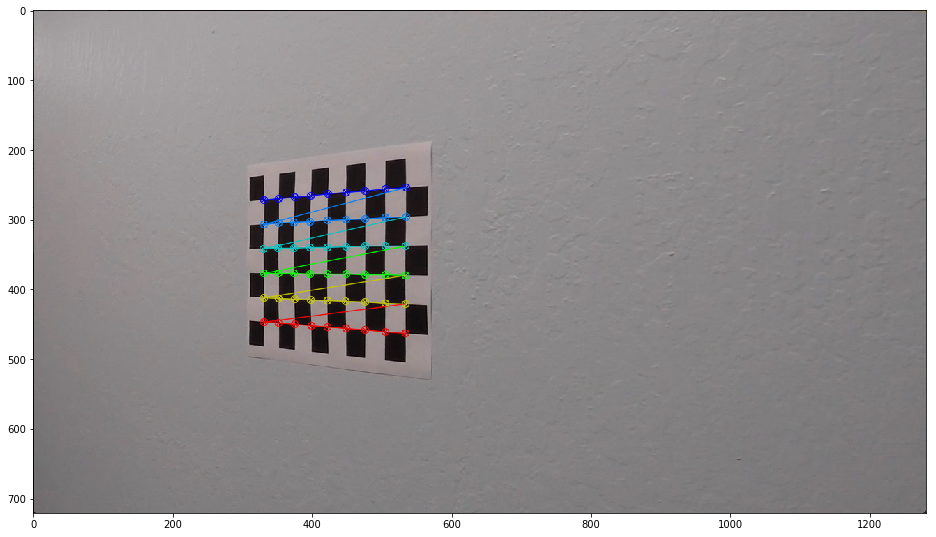

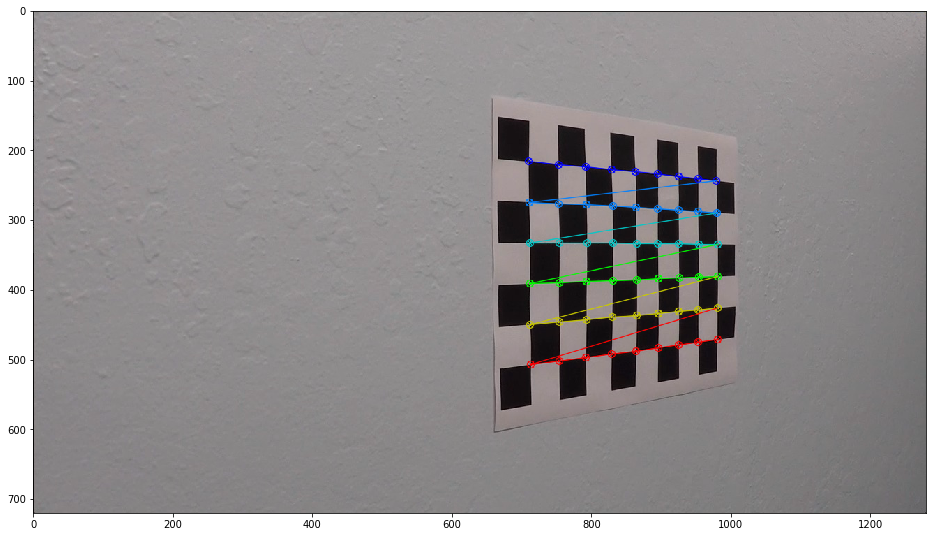

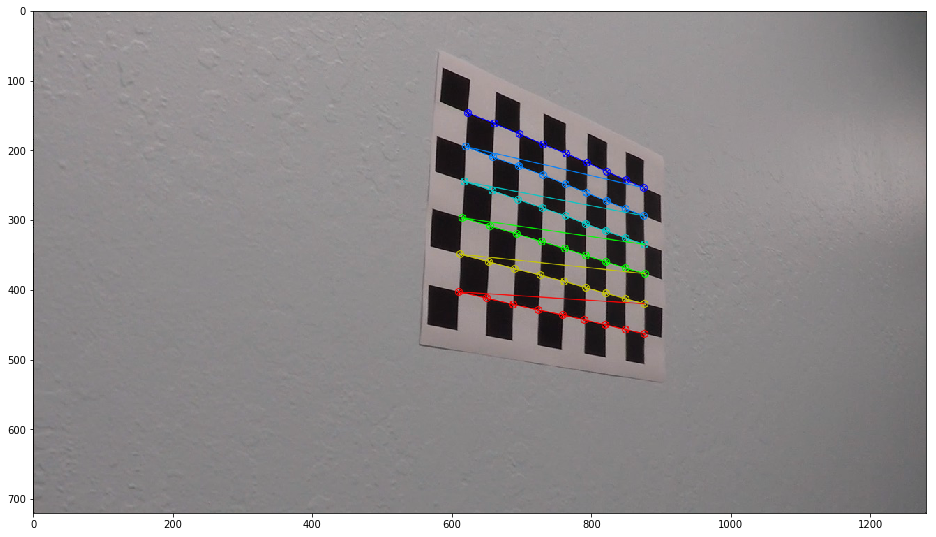

In [21]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

figure_size = (16, 16)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.figure(figsize=figure_size)
        plt.imshow(img)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)



### 2. Distortion Correction

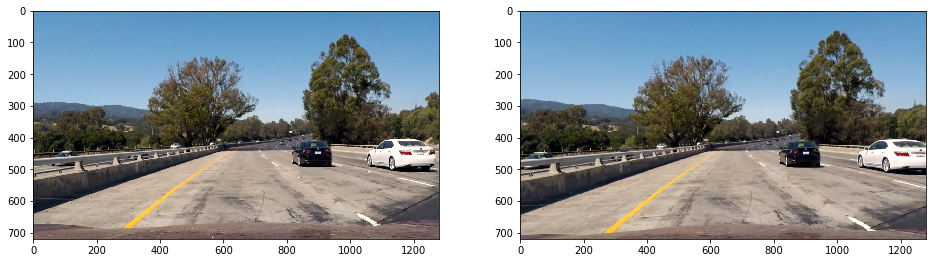

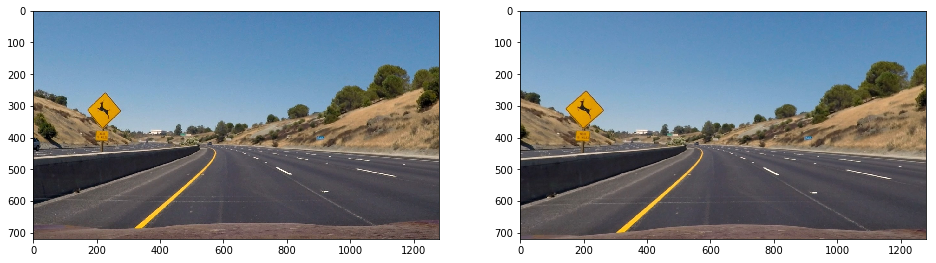

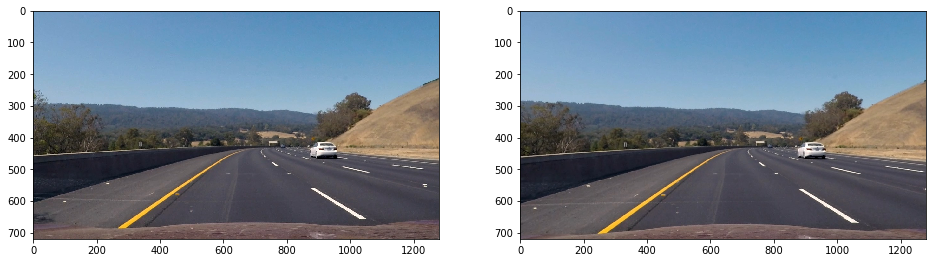

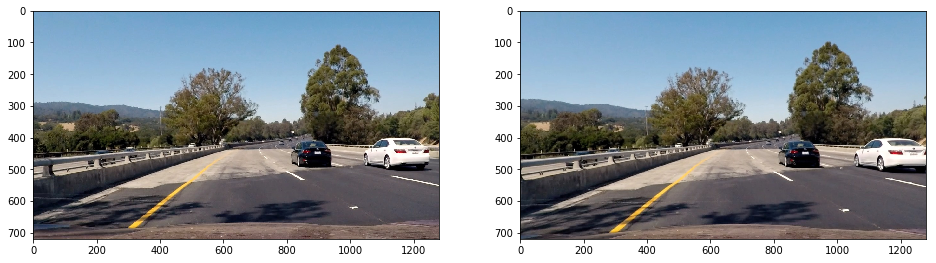

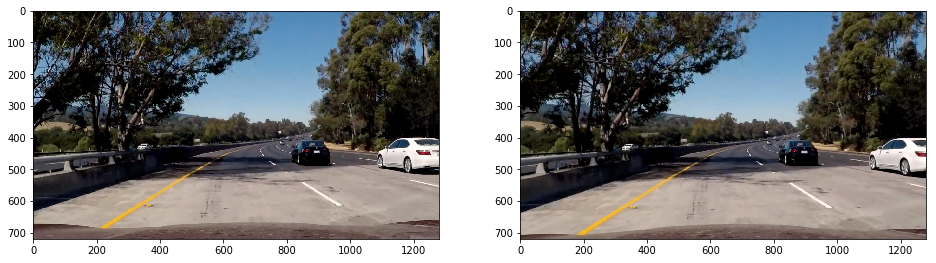

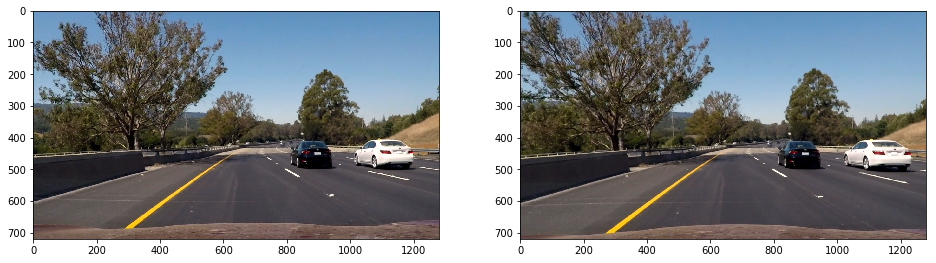

In [60]:
images = glob.glob('test_images/test*.jpg')
#images = glob.glob('t1_images/center*.jpg')
#images = glob.glob('t2_images/center*.jpg')

corrected_images = []

for fname in images:
    f = plt.figure(figsize=figure_size)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    f.add_subplot(1,2,1)
    plt.imshow(img)
    
    img = cv2.undistort(img, mtx, dist, None, mtx)
    f.add_subplot(1,2,2)
    plt.imshow(img)
    
    corrected_images.append(img)

### 3. Threshold Binary

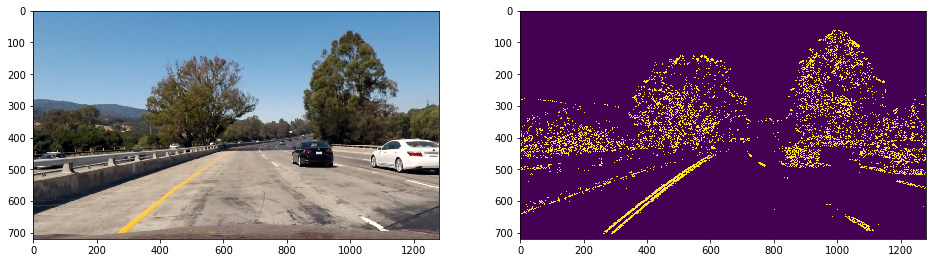

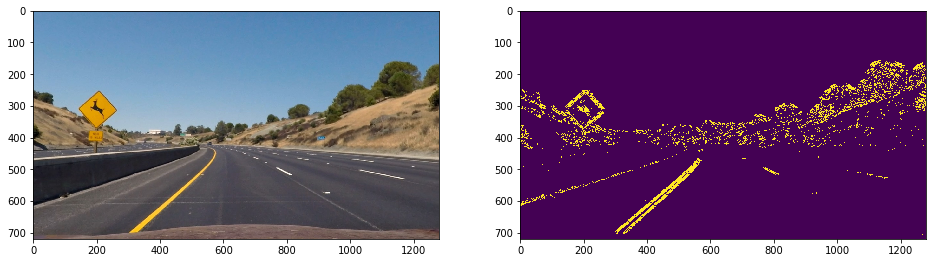

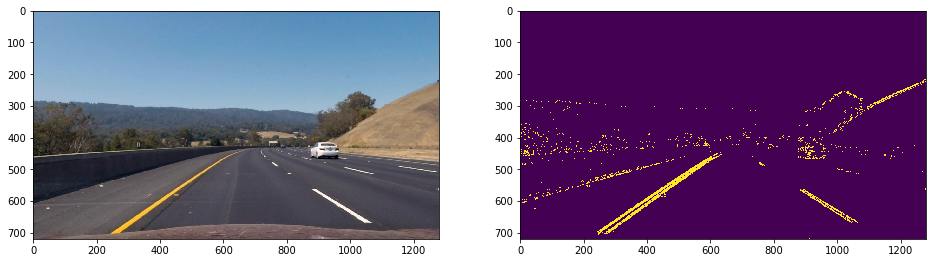

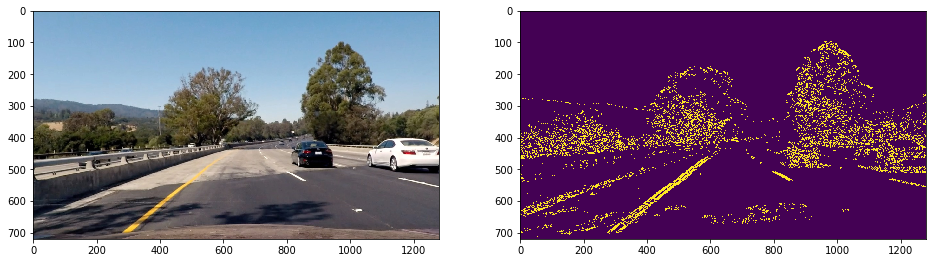

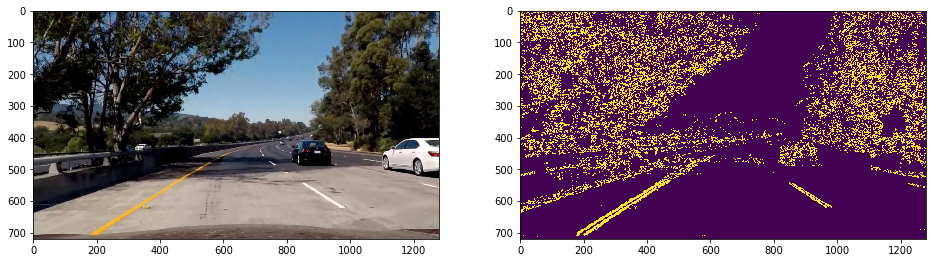

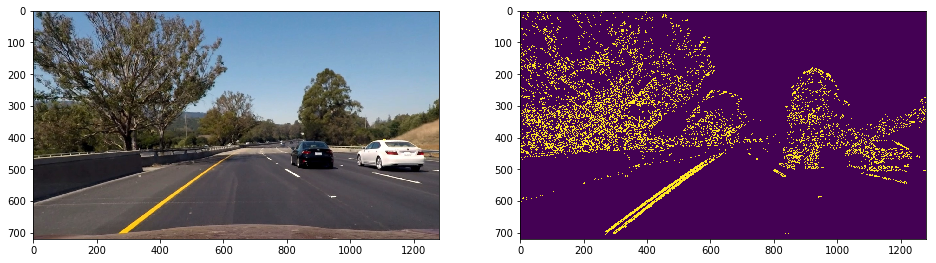

In [61]:
def abs_thresh(img, thresh):
    img = np.absolute(img)
    img = np.uint8(255 * img / np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[img >= thresh] = 1
    return binary_output

def mag_thresh(img_x, img_y, thresh):    
    img = np.sqrt(img_x**2 + img_y**2)
    img = np.uint8(255 * img / np.max(img))
    
    binary_output = np.zeros_like(img)
    binary_output[img >= thresh] = 1
    return binary_output

def dir_thresh(img_x, img_y, thresh):        
    img_x = np.absolute(img_x)
    img_y = np.absolute(img_y)
    
    img = np.arctan2(img_y, img_x)
        
    binary_output = np.zeros_like(img)
    binary_output[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

ksize = 5

for img in corrected_images:
    
    # Original image
    f = plt.figure(figsize=figure_size)
    f.add_subplot(1,2,1)
    plt.imshow(img)
    
    # Get S channel
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    img = img[:,:,2]
    
    # Get Sobel in x and y
    img_x = cv2.Sobel(img,cv2.CV_64F,1,0, ksize=ksize)
    img_y = cv2.Sobel(img,cv2.CV_64F,0,1, ksize=ksize)

    gradx = abs_thresh(img_x, thresh=10)
    grady = abs_thresh(img_y, thresh=10)
    
    magnitude = mag_thresh(img_x, img_y, thresh=10)
    direction = dir_thresh(img_x, img_y, thresh=(0.6, 1.4))
    
    img = np.zeros_like(img)
    img[((gradx == 1) & (grady == 1)) & ((magnitude == 1) & (direction == 1))] = 1
    
                   
    # Thresholded image
    f.add_subplot(1,2,2)
    plt.imshow(img)
    

### 4. Perspective Transform